# Assignment 4:
# Image classification using Convolutional Neural Networks

##  Introduction

The exercise covers the topics in classification using handcrafted images feature and classification using neural networks where the feature representation is learned implicitly.

In this assignment you will write code for the important parts needed for the image classification problem,
i.e. data preparation/augmentation, feature generation, classification using a Convolutional Neural Network. 

The dataset included for this exercise is the [LHI-Animal-Faces dataset](https://vcla.stat.ucla.edu/people/zhangzhang-si/HiT/exp5.html) from the publication: Z. Si and S.-C. Zhu. Learning hybrid image templates (HIT) by information projection. Pattern Analysis and Machine Intelligence, IEEE Transactions on, 34(7):1354–1367, 2012

Note that you don't need urgently a GPU for this assignemnt, so you should also be able to safely work with your own laptop. For experiments in section 7 yoou can use the pre-installed machines in E301. Please used the 2nd system partition (sda5). User: praktikum1, Password: MLlabWS24*

In [37]:

import os
os.environ['PYTHONHASHSEED'] = '0'

# Scientific and vector computation for python
import numpy as np

# Plotting library
from matplotlib import pyplot

# SVM model
from sklearn import model_selection

# for computing ROC and P-R curves
from sklearn import metrics

# library written for this exercise providing additional functions for assignment submission, and others
import utils

# common math things
import math

# Data loader for animal faces
import dataLoader

# some helper functions
import helpers

# opencv bridge
import cv2

# keras
from keras.models import Sequential
from keras import layers
# with tensorflow backend
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

# fixing the randomness
# Seed value
# Apparently you may use different seed values at each stage
seed_value= 42
# 1. Set `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)
# 2. Set `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)
# 3. Set `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)
# 4. Set the `tensorflow` pseudo-random generator at a fixed value
import tensorflow as tf
tf.random.set_seed(seed_value)
# for later versions: 
# tf.compat.v1.set_random_seed(seed_value)

# tells matplotlib to embed plots within the notebook
%matplotlib inline

# grader object
grader=utils.Grader()

# SET YOUR Authentication Token. To get the token login to http://evalml.da.private.hm.edu/ and check the User info menu item.
AUTH_TOKEN = "cd4a9aa7782d5a61a41c6dd48746e426d1f9a09a"
grader.setToken(AUTH_TOKEN)

## Submission and Grading

After completing each part of the assignment you are asked to submit your results.
1. Dataset preparation in test, train validation splits.
2. Plain image feature extraction.
3. Implement train steps using plain image features with a CNN classifier. 
4. Implement test steps using plain image features with a CNN classifier.
6. Evaluate quantitatively using confusion matrix and overall accuracy.
7. Train on complete dataset and evaluate results
8. Optional: Perform data augmentation to improve classification results. Best one wins a prize.

In the following table you will find the overview over the different tasks that you need to perform along with the points you can get:


| Section | Part                                             | Submitted Function / Values                              | Points |
| :-      |:-                                                |:-                                                        | :-:    |
| 1       | [Dataset preparation](#section1)                 | [`createDatasetSplits`](#createDatasetSplits)            |  10    |
| 2       | [Plain image feature ](#section2)            | [`extract_features`](#datasetSplits)                         |  10    |
| 3       | [CNN Training (Cats vs. Dogs)](#section3)     | [`cnnTraining`](#cnnTraining)                               |  35    |
| 4       | [CNN Test (Cats vs. Dogs)](#section4)          | [`cnnTest`](#cnnTest)                                      |  20    |
| 5       | [Confusion Matrix (Cats vs. Dogs)](#section5)  | [`compute_confusion_matrix_plot`](#compute_confusion_matrix_plot)|  10    |
| 6       | [CNN Train (All animals)](#section6)           | [`pred_all_test`](#pred_all_test)                          |  15   |
| 7       | [Optimization (All animals, optional, CHALLENGE)](#section7)   | [`pred_all_test_optimized`](#pred_all_test_optimized)|  -    |
|         | Total Points                                     |                                                          |100     |


You are allowed to submit your solutions multiple times. Correct results are not updated anymore.

At the end of each section, we have a cell which contains code for submitting the solutions thus far to the grader. Execute the cell to see your score up to the current section. For all your work to be submitted properly, you must execute those cells at least once. They must also be re-executed everytime the submitted function is updated.

## 1 Dataset Preparation
<a id="section1"></a>
For our classification experiments we will use the LHI-Animal-Faces dataset. This dataset consists “around 2200 images for 20 categories animal or human faces.Compared to other benchmarks, LHI-Animal-Faces has several good properties: (1) the animal face categories are similar to each other due to evolutional relationship and shared parts, and it is a challenging task to discern them; (2) the animal face categories exhibit interesting within class variation, which includes (i) rotation and flip transforms, e.g. rotated panda faces and left-or-right oriented pigeon heads; (ii) posture variation, e.g. rabbits with standing ears and relaxed ears; and (iii) sub-types, e.g. male and female lions” [1].

<img src="Figures/animals.png" alt="Animal Faces Dataset" style="width: 400px;"/>


In the first step you need to split the loaded images and labels into train, test and validation splits. In general, the train split is used to train the classifier. The validation split is used to tune hyperparameters of the classifier. The test set is not touched until you have found your final configuration and only used to test the final model.
Use a split of (train:val:test) of 60:20:20. 

Notes:
* Use `sklearn.model_selection.train_test_split` with `random_state=42`, to make sure we have the chance to get the same results. Note that the random component in NN architectures is the weight initialization which is necessary to give the backpropagation a starting point.
* The test set should be solely used for displaying final results (confusion matrix, images etc.). You should use the validation subset for tuning relevant parameters (model architecture, learning rate etc.)
* After loading the data, the dataset object is stored in the root folder for later access, which is always loaded when available. Please keep that in mind when you have changed something in the dataset struct, i.e., reload the dataset and store the object again.

Let's load the dataset first and display some statistics (as always: displaying stats is brilliant idea.)

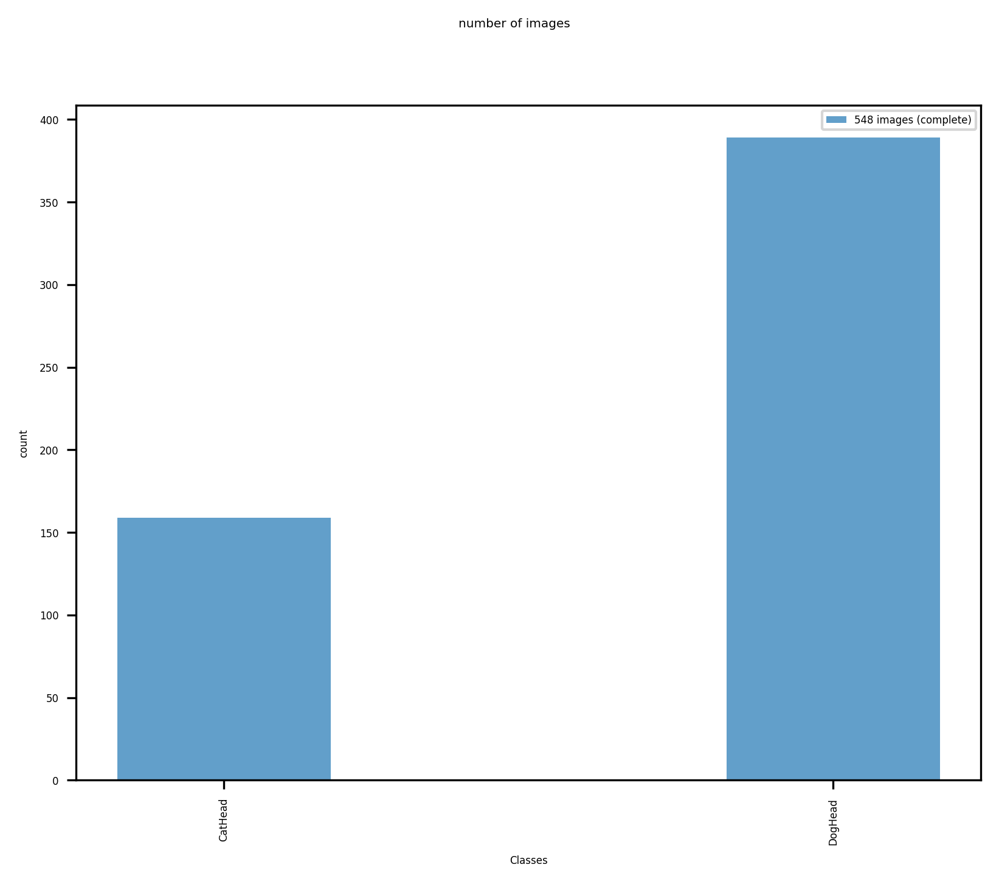

In [38]:
# load dataset
DATALOADER = dataLoader.AnimalFacesDataLoader() # initialize the dataloader

# For the beginning we just use a subset (cat and dog images) of the full training set
X,y = DATALOADER.loadDataset(all=False) # all=false loads only a subset of the data
y_names = DATALOADER.get_label_names() # get the label names

#Show some data statistics
DATALOADER.show_plot_data_statistics() # show some data statistics

Display some random sample on the data to get a visual impression (here: only cats/dogs).

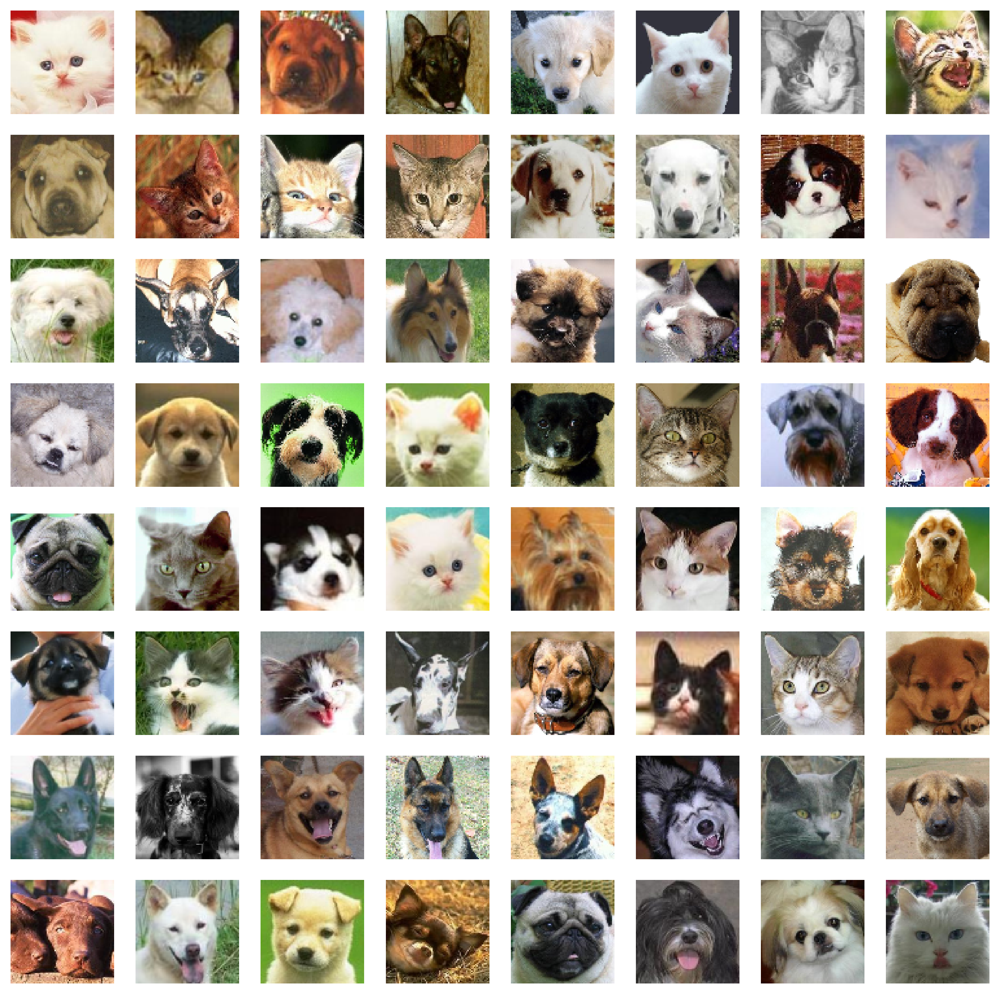

In [39]:
# inspect the dataset by displaying some random samples.
import random
nrow = 8 # number of rows
ncol = 8 # number of columns
_, axs = pyplot.subplots(nrow, ncol, figsize=(12, 12)) # create a grid of subplots
axs = axs.flatten() # flatten the subplots grid, what does flatten do?  -> it returns a copy of the array collapsed into one dimension.
for img, ax in zip(random.sample(X, nrow*ncol), axs): # iterate over a random sample of images
    ax.set_axis_off() # do not show axes
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) # show the image
pyplot.show() 

Your task is now to complete the function `createDatasetSplits`.

In [40]:
def createDatasetSplits(X, y, verbose=False):
    """
    Loads the dataset and creates train and validation data splits (data and labels) 
    
    Parameters
    ----------

    X : list
        List of samples where m is number of training examples; here: variable length strings.
    
    y : list
        List of labels for ther training data.
    
    verbose : bool
        If True, print the dataset split stats.

    Returns
    -------
    X_train : array_like
        (o, ) matrix of training samples where o is number of training examples; here: variable length strings.
    X_valid : array_like
        (p, ) matrix of validation samples where p is number of validation examples; here: variable length strings.
    X_test : array_like
        (p, ) matrix of test samples where p is number of test examples; here: variable length strings.
    y_train : array_like
        (o, ) vector of labels for training data.
    y_valid : array_like
        (p, ) vector of labels for validation data.
    y_test : array_like
        (p, ) vector of labels for test data.
    
    Instructions
    ------------
    Use the function train_test_split to split the loaded data into a train and validation set. 
    Use a 60:20:20 (train:val:test) random split of the complete data and use a random_state of 42.
    """

    X_train = [] # training data --> 60% 
    X_valid = [] # validation data --> 20%
    X_test = [] # test data --> 20%
    y_train = [] # training labels
    y_valid = [] # validation labels
    y_test = [] # test labels 

    # Splitting loaded data into train,validation and test dataset. 
    # Use a 60:20:20 (train:val:test) random split of the complete data
    # ====================== YOUR CODE HERE ======================
    X_train, X_temp, y_train, y_temp = model_selection.train_test_split(X, y, test_size=0.4, random_state=42) #first split to get test set (40%)
    X_valid, X_test, y_valid, y_test = model_selection.train_test_split(X_temp, y_temp, test_size=0.5, random_state=42) #second split to get train and validation set (50% of the remaining data)


    # =============================================================

    if verbose:
        print('----------------')
        print('Datasplits')
        print('Size of X_train: %d; %d percent of complete dataset' % (len(X_train), np.round(len(X_train)/len(X)*100)))
        print('Size of X_valid: %d; %d percent of complete dataset' % (len(X_valid), np.round(len(X_valid)/len(X)*100)))
        print('Size of X_test: %d; %d percent of complete dataset' % (len(X_test), np.round(len(X_test)/len(X)*100)))
        print('Size of y_train: %d; %d percent of complete dataset' % (len(y_train), np.round(len(y_train)/len(X)*100)))
        print('Size of y_valid: %d; %d percent of complete dataset' % (len(y_valid), np.round(len(y_valid)/len(X)*100)))
        print('Size of y_test: %d; %d percent of complete dataset' % (len(y_test), np.round(len(y_test)/len(X)*100)))
        print('----------------')

    return X_train, X_valid, X_test, y_train, y_valid, y_test

Execute the function

In [41]:
# train / validation split
print("Generating data splits ... ")
X_train, X_valid, X_test, y_train, y_valid, y_test = createDatasetSplits(X, y, verbose=1) # create the dataset splits (train: 60%, validation: 20%, test: 20%)

Generating data splits ... 
----------------
Datasplits
Size of X_train: 328; 60 percent of complete dataset
Size of X_valid: 110; 20 percent of complete dataset
Size of X_test: 110; 20 percent of complete dataset
Size of y_train: 328; 60 percent of complete dataset
Size of y_valid: 110; 20 percent of complete dataset
Size of y_test: 110; 20 percent of complete dataset
----------------


### Submission
You should now submit your solutions by executing the following cell.

In [42]:
# appends the implemented function to the grader object
grader.setFunc("createDatasetSplits", createDatasetSplits)
newfunc = grader.grade()

DEBUG:urllib3.connectionpool:Starting new HTTP connection (1): evalml.da.private.hm.edu:80
DEBUG:urllib3.connectionpool:http://evalml.da.private.hm.edu:80 "POST /result_receiver/ HTTP/11" 200 4292
                        Dataset preparation |  10 /  10 | Nice work!
                        Plain image feature |   0 /  10 | wrong
               CNN Training (Cats vs. Dogs) |   0 /  35 | wrong
                   CNN Test (Cats vs. Dogs) |   0 /  20 | wrong
           Confusion Matrix (Cats vs. Dogs) |   0 /  10 | wrong
                    CNN Train (All animals) |   0 /  15 | wrong
    Optimization (optional), pred accuracy: |   0 /   0 | wrong
                                  --------------------------------
                                            |  10 / 100 | 



## 2 Plain Image Feature Extraction
<a id="section2"></a>

We use just the raw three channel intensity values, i.e. a downscaled RGB image. We expect the network to extract meaningful feature on its own. Note again that we omit hand-designing the features like we would need to do for a SVM-based classifier (e.g. HOG features).

Scale down the input size of the image to 32x32 (width x height) and use the scaled down images as features.
Your task is now to complete the function `extract_features`.
Notes
* You could make use of the opencv `resize` function for scaling the image. Make sure the input to the resize function is a numpy array.
* Make sure your features are represented as `np.float32` values.


In [43]:
def extract_features(X):
        '''
        Input:
            X -- gray or color image depending on feature extraction method
        Output:
            feature_vector_array -- Numpy array of feature representations (also an array): scaled image of size self.INPUT_IMG_WIDTH * self.INPUT_IMG_HEIGHT * color_channels
        '''
        feature_vector_array = [] # what is a feature vector array --> it is an array of feature representations, f.e. scaled images

        # Scale down the input size of the image to 32x32 (width x height) and use the scaled down images as features.
        # ====================== YOUR CODE HERE ======================
        for img in X: # iterate over all images
            feature_vector_array.append(cv2.resize(img, (32, 32))) # resize the image to 32x32 and append it to the feature_vector_array

        # =============================================================

        return np.array(feature_vector_array)

You should check the result be executing the below cell. 

In [44]:
# s
print("Creating features from images ... ")
feature_vector_array = extract_features(X) # extract features from the images
print("Created %d feature vectors in array feature_vector_array." % len(feature_vector_array))

Creating features from images ... 
Created 548 feature vectors in array feature_vector_array.


Make sure that you have still a valid 32x32 image stored in each feature vector. Check with below code. You should see a 32x32 color image.

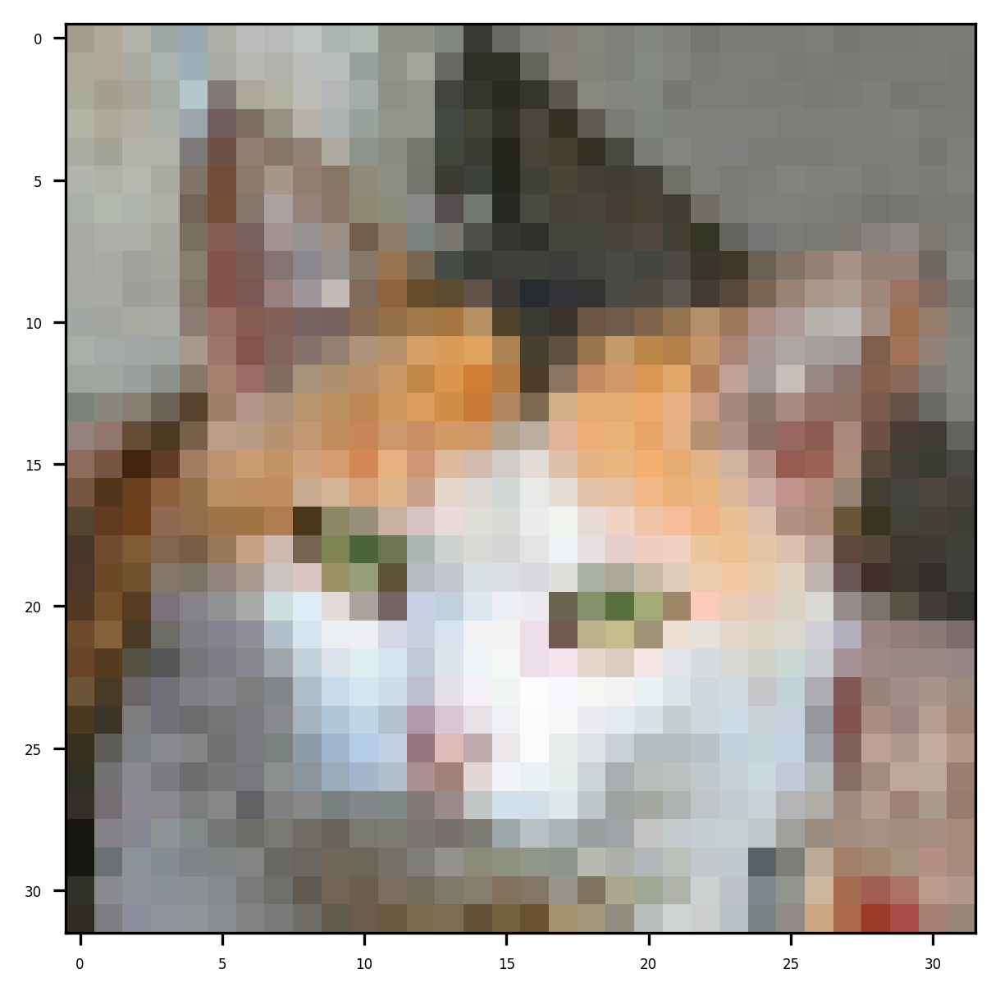

In [45]:
# plot one sample
if len(feature_vector_array)>20: # if we have more than 20 samples
    pyplot.imshow(cv2.cvtColor(np.array(feature_vector_array[20], np.uint8), cv2.COLOR_BGR2RGB)) # show the 20th sample

### Submission
You should now submit your solutions by executing the following cell.

In [46]:
# appends the implemented function to the grader object
grader.setFunc("extract_features", extract_features)
newfunc = grader.grade()

DEBUG:urllib3.connectionpool:Starting new HTTP connection (1): evalml.da.private.hm.edu:80
DEBUG:urllib3.connectionpool:http://evalml.da.private.hm.edu:80 "POST /result_receiver/ HTTP/11" 200 5275
                        Dataset preparation |  10 /  10 | Nice work!
                        Plain image feature |  10 /  10 | Nice work!
               CNN Training (Cats vs. Dogs) |   0 /  35 | wrong
                   CNN Test (Cats vs. Dogs) |   0 /  20 | wrong
           Confusion Matrix (Cats vs. Dogs) |   0 /  10 | wrong
                    CNN Train (All animals) |   0 /  15 | wrong
    Optimization (optional), pred accuracy: |   0 /   0 | wrong
                                  --------------------------------
                                            |  20 / 100 | 



## 3 CNN Training
<a id="section3"></a>
In this step we train a CNN classifier using Keras (a easy-to-use library with Tensorflow backend for training Neural Networks). Instead of relying on a hand-crafted feature representation like HOG (Histogram of Oriented Gradients) we would like to build our features implicitly in the neural network. This is possible because we will use multiple hidden layers which can learn and represent powerful feature representation which can then be classified (again) using a linear classifier. We could also use a SVM here again for the linear classification task. But we can also do the linear classification directly in the neural network by a final dense layer and a Softmax activation function.
For a start I recommend the following layer configuration:
1)	    Input layer with correct image size (32x32x3 for color)
2)	    Convolution with a 3x3 kernel resulting in 64 feature maps; Activation function: Rectified Linear Unit (ReLu)
3)	    2x2 Max Pooling, Stride 2x2
4)      Drop Out Layer, 25% drop out probability
5)	    Convolution with a 3x3 kernel resulting in 128 feature maps; Activation function: Rectified Linear Unit (ReLu)
6)	    2x2 Max Pooling, Stride 2x2
7)      Drop Out Layer, 25% drop out probability
8)	    Flattening layer
9)	    Fully connected layer (Dense) on the flattened vector with 512 neurons as output; Activation function: Rectified Linear Unit (ReLu)
10)     Drop Out Layer, 25% drop out probability
10)	    Fully connected layer (Dense) with num_labels neurons as output; Activation function: Softmax

Note that this model is by definition already a `Deep Neural Network`.
Train this model using the SparseCategoricalCrossentropy loss, which is a variant of the already discussed cross entropy loss working on sparse categorical labels (i.e. integers). As optimizer use the Adam optimizer which controls how the learning rate is adapted during training.
Start training with 50 epochs and a batch_size of 32 images per batch. For each batch one iteration of backpropagation is computed. An epoch contains #samples / #batch_size iterations and the classifier has seen all samples once in one epoch.

Notes: 
* To make training easier it is important to normalize feature values. You can do so by substracting the mean computed across all feature values in training set and dividing by the standard deviation (scaling) across all feature values in training set. Make sure that you save this mean and scaling factor in your resulting classifier object to be able to apply this normalization also in the test case (see classifier dict at the end of the function). 
* You could make use of the following imports: keras.models.Sequential, keras.layers (Conv2D, MaxPooling2D, Flatten, Dense), tf.kersas.losses.SparseCategoricalCrossentropy
* use the verbose flag to see some output of the function


Your task is now to complete the function `cnnTraining`.

In [ ]:
def cnnTraining (trainData, trainLabels, valData, valLabels, num_epochs=30, num_batches=32, verbose = 2):
    '''
    Training of classfier

    Input:
        (trainData) -- Training data array
        (trainLabels) -- Training label 1d array
        (valData) -- Validation data array
        (valLabels) -- Validation labels 1d array
        (num_epochs) -- Num epochs to train (after each epoch the training has seen the complete training data
        (num_batches) -- Number of samples in one batch (check slides on Batch Gradient Descent)
        (verbose) -- 0: no debug; 1-2: more debug
    Output:
        Trained classifier dictionary struct containing classifier model, history and normalization parameters.
    '''

    print("Training CNN classifier....")
    # convert list of labels to binary class matrix

    # Rest the rnd generators
    seed_value= 42 # seed value
    random.seed(seed_value) # 2. Set `python` built-in pseudo-random generator at a fixed value
    np.random.seed(seed_value) # 3. Set `numpy` pseudo-random generator at a fixed value
    tf.random.set_seed(seed_value) # 4. Set the `tensorflow` pseudo-random generator at a fixed value
    
    classifier = None # classifier dictionary struct containing classifier model, history and normalization parameters
    # You need to specifiy the CNN model and the hyperparameters (e.g. layers, batch_size, optimizer, loss function, epochs). 
    # Normalize training feature values for easiier training and save normalization paramteres for later application.
    # You might wanna apply the validation dataset directly in the fit function to receive some validation results duriong training after each epoch.

    labels_train = np.array(trainLabels)
    labels_val = np.array(valLabels)

    #feature_array_train = np.zeros(1) # replace this
    #feature_array_val = np.zeros(1) # replace this

    # pre-processing: create feature vectors, i.e. use above implemented function
    # ====================== YOUR CODE HERE ======================
    feature_array_train = extract_features(trainData) # extract features from the training data
    feature_array_val = extract_features(valData) # extract features from the validation data

    feature_array_train = np.array(feature_array_train, np.float32) # convert the training data to a numpy array
    feature_array_val = np.array(feature_array_val, np.float32) # convert the validation data to a numpy array

    # =============================================================

    scale=0 # compute this an use for normalization
    mean=0 # compute this an use for normalization
    # Normalize training feature values for easier training and save normalization paramteres for later application.
    # pre-processing: substract mean and divide by std dev; mean and std dev calculated on trainig data
    # ====================== YOUR CODE HERE ======================
    mean = np.mean(feature_array_train, axis=0) # calculate the mean of the training data
    scale = np.std(feature_array_train, axis=0) # calculate the standard deviation of the training data
    
    feature_array_train = (feature_array_train - mean) / scale # normalize the training data
    feature_array_val = (feature_array_val - mean) / scale # normalize the validation data
    # =============================================================
    
    num_lables = len(np.unique(labels_train))
    model = Sequential()

    # create CNN architecture
    # You need to specifiy the CNN layers and layer parameters as written above.
    # ====================== YOUR CODE HERE ======================
    # input_shape = (32, 32, 3) # input shape of the images (32: width, 32: height, 3: color channels)
    
    # Schicht 1 (ist input shape)
    input_shape = feature_array_train.shape[1:] # input shape of the images (32: width, 32: height, 3: color channels)
    # Schicht 2 (Convolution, 3x3 kernel --> 64 feature maps, ReLu)
    model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape))
    # Schicht 3 (2x2 Max Pooling, Stride 2x2)
    model.add(layers.MaxPooling2D((2, 2)))
    # Schicht 4 (Drop Out Layer, 25% dropout propability)
    model.add(layers.Dropout(0.25))
    # Schicht 5 (Convolution, 3x3 kernel --> 128 feature maps, ReLu)
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    # Schicht 6 (2x2 Max Pooling, Stride 2x2)
    model.add(layers.MaxPooling2D((2, 2)))
    # Schicht 7 (Drop Out Layer, 25% dropout propability)
    model.add(layers.Dropout(0.25))
    # Schicht 8 (Flatten)
    model.add(layers.Flatten())
    # Schicht 9 (Fully Connected Layer, 512 Neurons, ReLu)
    model.add(layers.Dense(512, activation='relu'))
    # Schicht 10 (Drop Out Layer, 25% dropout propability)
    model.add(layers.Dropout(0.25))
    # Schicht 11 (Fully Connected Layer, num_lables Neurons, Softmax)
    model.add(layers.Dense(num_lables, activation='softmax'))


    # =============================================================

    # prints a summary of the architecture
    model.summary()
    print("Training...")

    # optimizer (i.e. strategy for learnig rate adaption when using backpropagation)
    model.compile(optimizer='adam',
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=['accuracy'])
    
    # perform the optimization and provide data
    # history object containit some data on the training to plot later (e.g. loss and accuracy on training and validation set)
    history = model.fit(feature_array_train, labels_train, validation_data=(feature_array_val, labels_val), epochs=num_epochs, batch_size=num_batches, verbose=verbose)
    classifier = {'model':model, 'history':history, 'scale':scale, 'mean':mean}

    return classifier


Now train your classifier. You might wanna use smaller epoch size first for a quicker evaluation if things go in the right direction.

In [60]:
#perorm the training
classifier = cnnTraining(X_train, y_train, X_valid, y_valid, num_epochs=20, num_batches=16, verbose = 2)

Training CNN classifier....


/Users/peer/Documents/GITLAB_1/mlex-24-por/mlex_venv/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_13 (Conv2D)              │ (None, 30, 30, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 15, 15, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 15, 15, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 13, 13, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 512)            │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 2)              │         1,026 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,436,482 (9.29 MB)

 Trainable params: 2,436,482 (9.29 MB)

 Non-trainable params: 0 (0.00 B)

Training...
Epoch 1/20
21/21 - 1s - 35ms/step - accuracy: 0.6463 - loss: 0.8208 - val_accuracy: 0.6455 - val_loss: 0.6549
Epoch 2/20
21/21 - 0s - 14ms/step - accuracy: 0.7744 - loss: 0.4881 - val_accuracy: 0.7000 - val_loss: 0.5796
Epoch 3/20
21/21 - 0s - 13ms/step - accuracy: 0.8079 - loss: 0.4115 - val_accuracy: 0.7818 - val_loss: 0.4831
Epoch 4/20
21/21 - 0s - 13ms/step - accuracy: 0.8537 - loss: 0.3666 - val_accuracy: 0.7455 - val_loss: 0.5224
Epoch 5/20
21/21 - 0s - 13ms/step - accuracy: 0.8750 - loss: 0.3249 - val_accuracy: 0.8000 - val_loss: 0.4334
Epoch 6/20
21/21 - 0s - 15ms/step - accuracy: 0.8902 - loss: 0.2483 - val_accuracy: 0.8182 - val_loss: 0.3925
Epoch 7/20
21/21 - 0s - 14ms/step - accuracy: 0.9207 - loss: 0.1925 - val_accuracy: 0.8273 - val_loss: 0.3688
Epoch 8/20
21/21 - 0s - 13ms/step - accuracy: 0.9512 - loss: 0.1389 - val_accuracy: 0.8000 - val_loss: 0.4361
Epoch 9/20
21/21 - 0s - 15ms/step - accuracy: 0.9543 - loss: 0.1125 - val_accuracy: 0.8636 - val_loss: 0.337

Not that the object 'classifer' contains your model, the history, and the normalization parameters which are also needed later for test. Let's use the stored history to plot the training and validation accuracy to see how things have evolved. Executing the below cell should show somehting similar to this plot.

<img src="Figures/acc_catsdogs.png" alt="Accuracy Dogs Cats" style="width: 400px;"/>

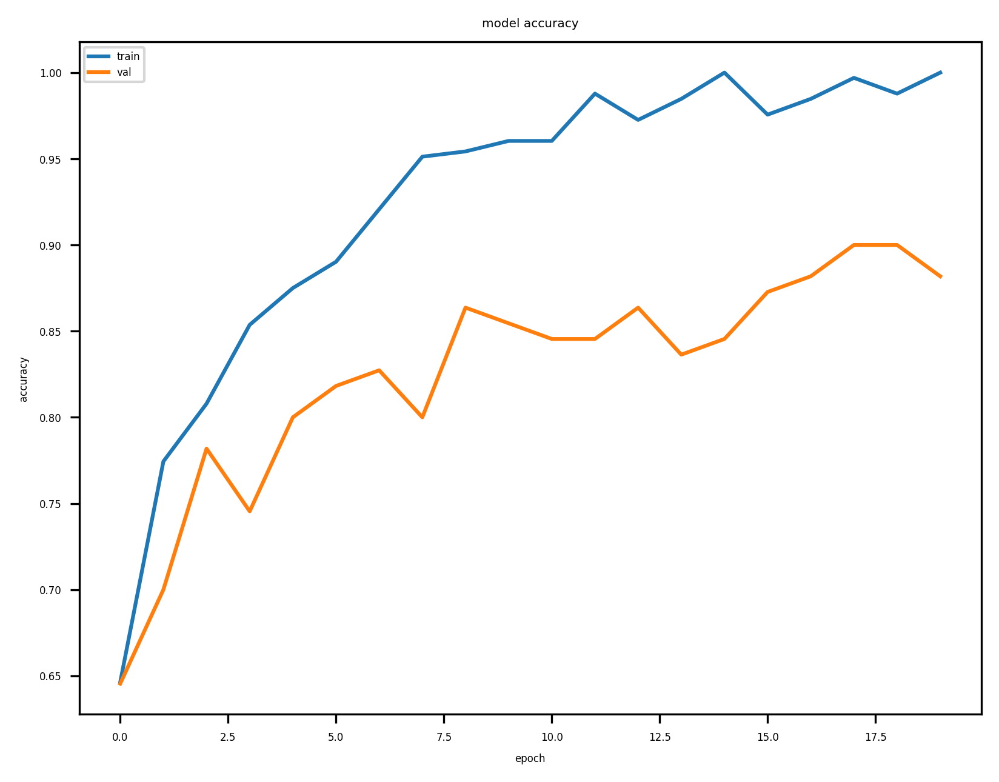

In [61]:
#lets plot the validation and train accuracy over the epochs
pyplot.plot(classifier['history'].history['accuracy'])
pyplot.plot(classifier['history'].history['val_accuracy'])
pyplot.title('model accuracy')
pyplot.ylabel('accuracy')
pyplot.xlabel('epoch')
pyplot.legend(['train', 'val'], loc='upper left')
pyplot.show()

### Submission
You should now submit your function. To pass this you neeed to reach a validation accuracy for the problem of 85% or above.

In [62]:
# appends the implemented function to the grader object
grader.setValue("cnnTraining", classifier['history'].history['val_accuracy'])
newfunc = grader.grade()

DEBUG:urllib3.connectionpool:Starting new HTTP connection (1): evalml.da.private.hm.edu:80
DEBUG:urllib3.connectionpool:http://evalml.da.private.hm.edu:80 "POST /result_receiver/ HTTP/11" 200 6769
                        Dataset preparation |  10 /  10 | Nice work!
                        Plain image feature |  10 /  10 | Nice work!
               CNN Training (Cats vs. Dogs) |  20 /  35 | Nice work!
                   CNN Test (Cats vs. Dogs) |   0 /  20 | wrong
           Confusion Matrix (Cats vs. Dogs) |   0 /  10 | wrong
                    CNN Train (All animals) |   0 /  15 | wrong
    Optimization (optional), pred accuracy: |   0 /   0 | wrong
                                  --------------------------------
                                            |  40 / 100 | 



## 4 CNN Test
<a id="section4"></a>
Next we will use our model to predict the class of some unseen images (i.e. our test images). 
Your task is now to complete the function `cnnTest` which uses your classifier object and applies it to new data X.

Notes:
* Make sure you handle the data exactly in the same way as you have done it for training, i.e., the features used in cnnTest need to use the same pre-processing pipeline as used for training. Furthermore, don't forget to normalize the feature values as also done in training (substract mean and divide by std deviation using the values in the classifier object).

In [63]:
def cnnTest(classifier, X):
    '''
    Classification of feature samples

    Input:
        (classifier) -- classifier object ({'model':model, 'history':history, 'scale':scale, 'mean':mean})
        (X) -- data samples (single or list) for classification
    Output:
        predictions for each feature sample: 
        either probabilites resulting in a 2d array of size (#samples, #classes)
    '''
    prediction = []

    # Make sure you handle the data exactly in the same way as you have done it for training, 
    # i.e., the features used in cnnTest need to use the same pre-processing pipeline as used for training. 
    # Furthermore, don't forget to normalize the feature values as also done in training 
    # (substract mean and divide by std deviation using the values in the classifier object).
    # ====================== YOUR CODE HERE ======================
    feature_array = extract_features(X) # extract features from the data
    feature_array = (feature_array - classifier['mean']) / classifier['scale'] # normalize the data
    prediction = classifier['model'].predict(feature_array) # predict the data using the model
    
    # =============================================================
    
    return prediction   


Let's use your prediction function now

In [64]:
pred_test = cnnTest(classifier, X_test)
print("Classification accuracy on test set: %0.4f" % helpers.get_classification_accuracy(y_test, pred_test))

1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/stepWARNING:tensorflow:6 out of the last 23 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x3420d2ca0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Classification accuracy on test set: 90.0000


Next, visualize the results (qualitative evaluation). 
You should see an array of images with red and green borders. Green are correctly classified samples and read are incorrectly classified samples respectively.

In [65]:
def show_classified_samples(images, preds, labels):
    max_pred = np.argmax(preds, axis=-1) # get the index of the maximum value in the prediction array
    matches = [1 if i==j else 0 for i, j in zip(max_pred,labels)] # check if the predicted label matches the true label
    nrow = 8 # number of rows
    ncol = 8 # number of columns
    _, axs = pyplot.subplots(nrow, ncol, figsize=(12, 12)) # create a grid of subplots
    axs = axs.flatten() # flatten the subplots grid
    for img, correct, ax in zip(random.sample(images, nrow*ncol), matches, axs): # iterate over a random sample of images
        img_sample_copy = np.array(img).copy() # create a copy of the image
        if(not correct): # if the prediction is not correct
            color = (0,0,255) # set the color to red
        else: 
            color = (0,255,0) # set the color to green
        cv2.rectangle(img_sample_copy, (0, 0), (img_sample_copy.shape[0], img_sample_copy.shape[1]), color, 4) # draw a rectangle around the image
        # you could also decide to visualize the probability with a text object on each image sample
        # cv2.putText(img_sample_copy, "%0.2f" % pred_val, text_origin, font, fontScale, color, thickness, cv2.LINE_AA)
        ax.set_axis_off()
        ax.imshow(cv2.cvtColor(img_sample_copy, cv2.COLOR_BGR2RGB))

    pyplot.show()


Executing `show_classified_samples` should give you a plot similar to this one.

<img src="Figures/qual_catsdogs.png" alt="Accuracy Dogs Cats" style="width: 400px;"/>

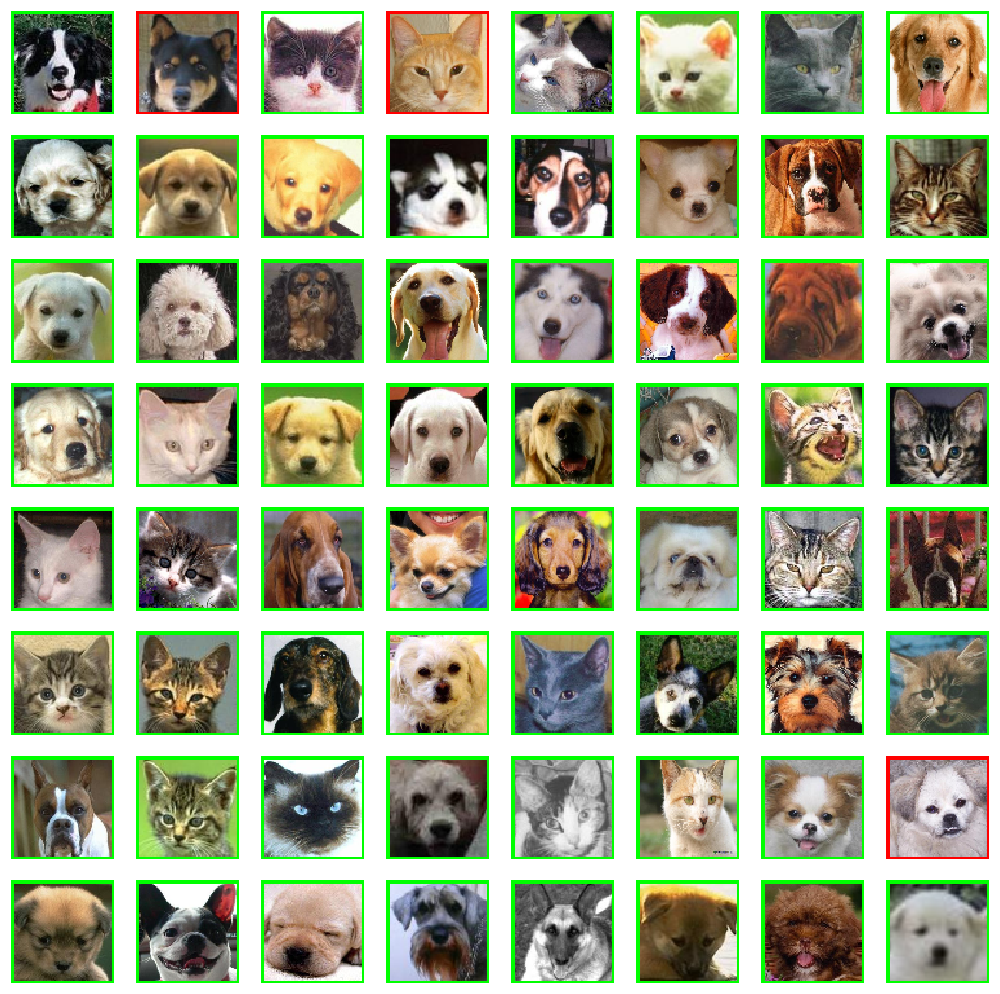

In [66]:
# qualitative evaluation (inspect samples and classification)
show_classified_samples(X_test, pred_test, y_test)

### Submission
After checking that everything works as expected, you should now submit your function. To pass this you neeed to reach a test accuracy for the problem of 80% or above.

In [67]:
# appends the implemented function to the grader object
grader.setValue("cnnTest", dict({"test": list(y_test), "pred" : np.array(pred_test).tolist()}))
newfunc = grader.grade()

DEBUG:urllib3.connectionpool:Starting new HTTP connection (1): evalml.da.private.hm.edu:80
DEBUG:urllib3.connectionpool:http://evalml.da.private.hm.edu:80 "POST /result_receiver/ HTTP/11" 200 11711
                        Dataset preparation |  10 /  10 | Nice work!
                        Plain image feature |  10 /  10 | Nice work!
               CNN Training (Cats vs. Dogs) |  20 /  35 | Nice work!
                   CNN Test (Cats vs. Dogs) |  35 /  20 | Nice work!
           Confusion Matrix (Cats vs. Dogs) |   0 /  10 | wrong
                    CNN Train (All animals) |   0 /  15 | wrong
    Optimization (optional), pred accuracy: |   0 /   0 | wrong
                                  --------------------------------
                                            |  75 / 100 | 



## 5 Confusion Matrix (Cats vs. Dogs)
<a id="section5"></a>
A confusion matrix C is such that $C_(i,j)$ is equal to the number of observations known to be in group i and predicted to be in group j. Therefore, a confusion matrix allows to see the inter-class confusion. On the diagonal you see the number of correctly predicted samples, and on the other off-diagonal elements you can read what class was instead predicted. This allows some good insights in classification errors and also identify possible steps for improvement. 

Your task is now to complete the function `compute_confusion_matrix_plot`. 

Notes:
* Here you need to call the correct function from `sklearn.metrics` to compute the confusion matrix and use the result of `compute_confusion_matrix_plot` in `helpers.plot_confusion_matrix` which performs a nice plot of the confusion matrix. Alternatively for sure you can compute the confusion matrix also on your own.
* Also normalize the confusion matrix.

In [68]:
def compute_confusion_matrix_plot(predictions, labels):
    '''
    Shows confusion matrix
    Input:
        predictions
        labels
    '''
    assert(len(labels)==len(predictions))

    # in case we have (#smaple x #classes) we have a probability prediction, 
    # so we need to find the label with max probability
    if predictions.ndim==2: # if the number of dimensions of the predictions is 2
        pred_max = np.argmax(predictions, axis=-1) # get the index of the maximum value in the prediction array
    else:
        pred_max = predictions # otherwise, the prediction is already the index of the maximum value in the prediction array

    confMatrix = np.zeros((2,2)) # create a 2x2 matrix of zeros

    # compute the confusion matrix (call the right function in sklearn)
    # ====================== YOUR CODE HERE ======================
    confMatrix = metrics.confusion_matrix(labels, pred_max) # compute the confusion matrix

    # =============================================================

    # return confusion matrix
    return confMatrix

Your confusion matrix should look for the two-class case similar to this one.

<img src="Figures/conf_catsdogs.png" alt="Accuracy Dogs Cats" style="width: 400px;"/>


Normalized confusion matrix
[[0.82352941 0.17647059]
 [0.06578947 0.93421053]]


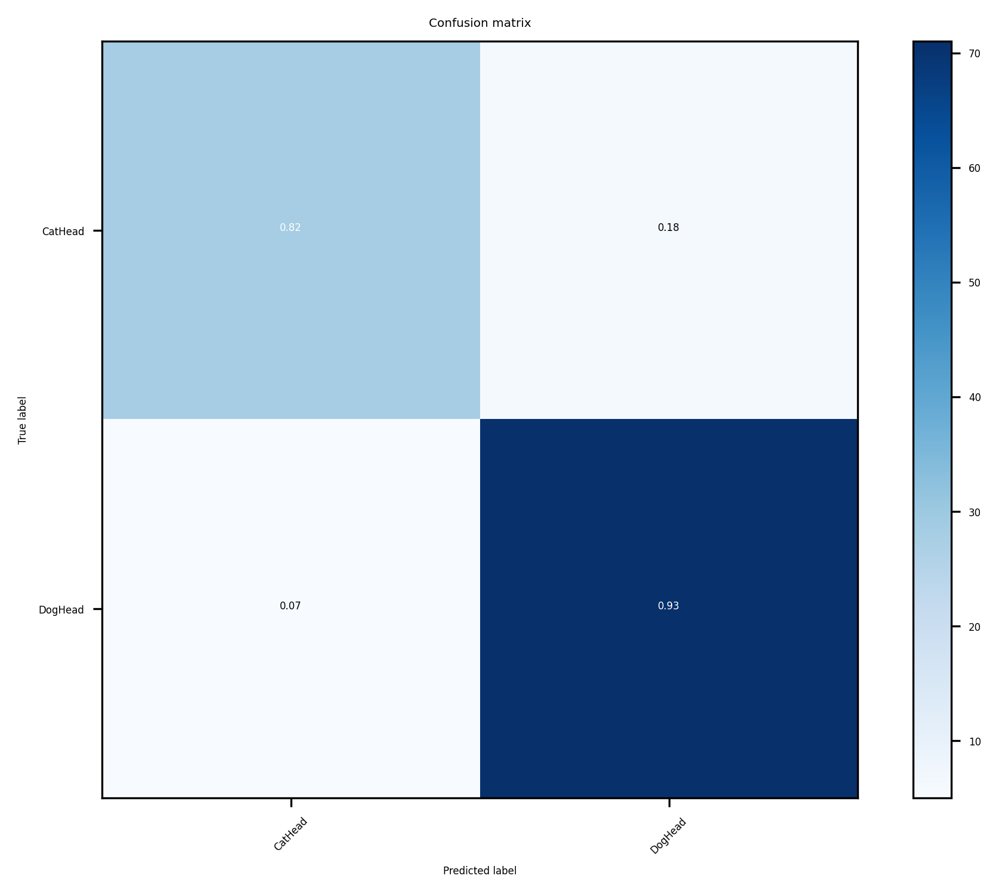

In [69]:
cm = compute_confusion_matrix_plot(pred_test, y_test)
# Plot normalized confusion matrix
helpers.plot_confusion_matrix(cm, DATALOADER.get_label_names())


### Submission
You are ready to submit your function now.

In [70]:
# appends the implemented function to the grader object
grader.setFunc("compute_confusion_matrix_plot", compute_confusion_matrix_plot)
newfunc = grader.grade()

DEBUG:urllib3.connectionpool:Starting new HTTP connection (1): evalml.da.private.hm.edu:80
DEBUG:urllib3.connectionpool:http://evalml.da.private.hm.edu:80 "POST /result_receiver/ HTTP/11" 200 11711
                        Dataset preparation |  10 /  10 | Nice work!
                        Plain image feature |  10 /  10 | Nice work!
               CNN Training (Cats vs. Dogs) |  20 /  35 | Nice work!
                   CNN Test (Cats vs. Dogs) |  35 /  20 | Nice work!
           Confusion Matrix (Cats vs. Dogs) |   0 /  10 | wrong
                    CNN Train (All animals) |   0 /  15 | wrong
    Optimization (optional), pred accuracy: |   0 /   0 | wrong
                                  --------------------------------
                                            |  75 / 100 | 



# 6 CNN classifier train (All animals)
<a id="section6"></a>

We will no extend our dataset to the full set of [LHI-Animal-Faces dataset](https://archive.ics.uci.edu/ml/datasets/SMS+Spam+Collection) (21 classess). This results in a classification problem which is much harder then the previous 2-class problem. Anyway, if correctly implemented, you should be able to use your previous functions to train and test your classifier for the extended dataset as well.

Let's load the full data

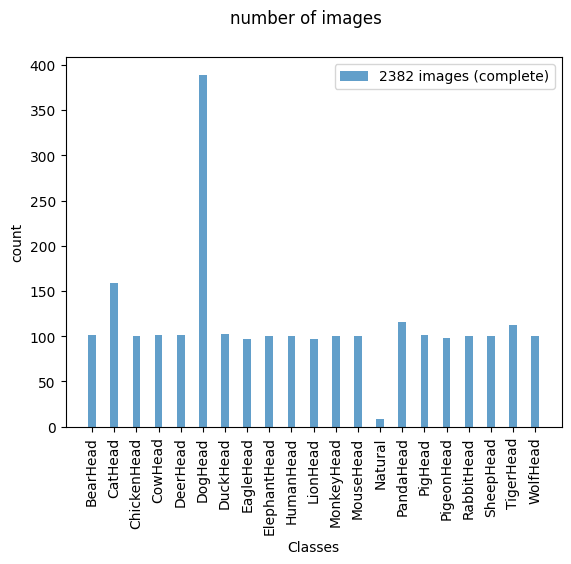

In [23]:
# load dataset
DATALOADER = dataLoader.AnimalFacesDataLoader()

# For the beginning we just use a subset (cat and dog images) of the full training set
X_all,y_all = DATALOADER.loadDataset(all=True)
y_all_names = DATALOADER.get_label_names()

#Show some data statistics
DATALOADER.show_plot_data_statistics()

Let's view some samples...

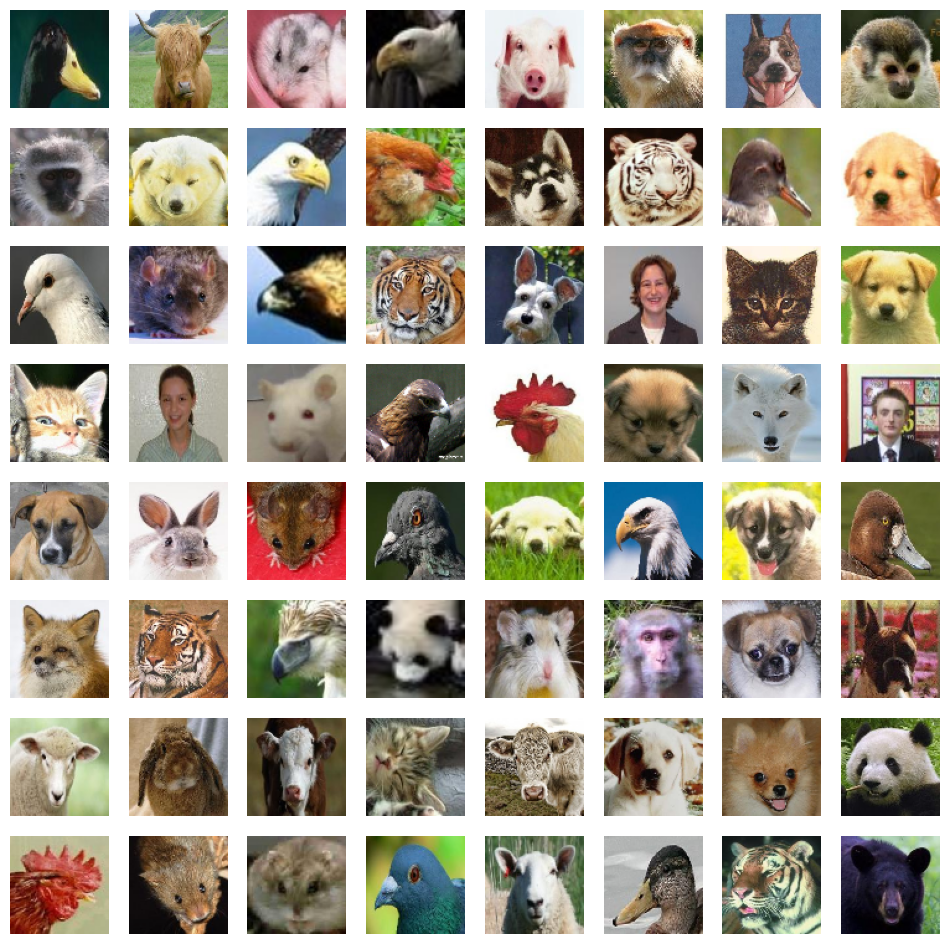

In [24]:
import random
nrow = 8
ncol = 8
_, axs = pyplot.subplots(nrow, ncol, figsize=(12, 12))
axs = axs.flatten()
for img, ax in zip(random.sample(X_all, nrow*ncol), axs):
    ax.set_axis_off()
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
pyplot.show()

Your task is now to call the previously implemented functions correctly to train a model on the full set. You should receive a classification performance on the test set of above 70%. Please note that while we achieved around 95% for the 2-class problem, the 70% accuracy is now the one computed over all 21 classes.

In [25]:
# Perform all steps to train a classifier model on training data and then test it on the test data
# Please use again a 60:20:20 share for train:valid:test data split
pred_all_test = [] #this variable should get your predictions on the test set (all animals).
X_all_train= []
X_all_valid= []
X_all_test= []
y_all_train= []
y_all_valid= []
y_all_test= []
# ====================== YOUR CODE HERE ======================
X_all_train, X_all_valid, X_all_test, y_all_train, y_all_valid, y_all_test = createDatasetSplits(X_all, y_all, verbose=1) # create the dataset splits (train: 60%, validation: 20%, test: 20%)

classifier_all = cnnTraining(X_all_train, y_all_train, X_all_valid, y_all_valid, verbose = 2) # train the classifier on the training data

pred_all_test = cnnTest(classifier_all, X_all_test) # test the classifier on the test data



# =============================================================

print("Classification accuracy on test set: %0.4f" % helpers.get_classification_accuracy(y_all_test, pred_all_test))


----------------
Datasplits
Size of X_train: 1429; 60 percent of complete dataset
Size of X_valid: 476; 20 percent of complete dataset
Size of X_test: 477; 20 percent of complete dataset
Size of y_train: 1429; 60 percent of complete dataset
Size of y_valid: 476; 20 percent of complete dataset
Size of y_test: 477; 20 percent of complete dataset
----------------
Training CNN classifier....


/Users/peer/Documents/GITLAB_1/mlex-24-por/mlex_venv/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 30, 30, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 15, 15, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 15, 15, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 13, 13, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 21)             │        10,773 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,446,229 (9.33 MB)

 Trainable params: 2,446,229 (9.33 MB)

 Non-trainable params: 0 (0.00 B)

Training...
Epoch 1/30
45/45 - 1s - 27ms/step - accuracy: 0.1987 - loss: 2.7259 - val_accuracy: 0.3067 - val_loss: 2.3245
Epoch 2/30
45/45 - 1s - 16ms/step - accuracy: 0.4332 - loss: 1.8708 - val_accuracy: 0.4979 - val_loss: 1.7184
Epoch 3/30
45/45 - 1s - 16ms/step - accuracy: 0.5976 - loss: 1.3031 - val_accuracy: 0.5693 - val_loss: 1.4642
Epoch 4/30
45/45 - 1s - 17ms/step - accuracy: 0.6851 - loss: 0.9821 - val_accuracy: 0.6534 - val_loss: 1.3096
Epoch 5/30
45/45 - 1s - 16ms/step - accuracy: 0.7670 - loss: 0.7451 - val_accuracy: 0.6450 - val_loss: 1.2359
Epoch 6/30
45/45 - 1s - 15ms/step - accuracy: 0.8495 - loss: 0.4970 - val_accuracy: 0.6597 - val_loss: 1.1611
Epoch 7/30
45/45 - 1s - 16ms/step - accuracy: 0.8964 - loss: 0.3370 - val_accuracy: 0.6870 - val_loss: 1.2220
Epoch 8/30
45/45 - 1s - 16ms/step - accuracy: 0.9251 - loss: 0.2417 - val_accuracy: 0.6765 - val_loss: 1.2175
Epoch 9/30
45/45 - 1s - 16ms/step - accuracy: 0.9356 - loss: 0.2092 - val_accuracy: 0.6744 - val_loss: 1.256

Use our above function `show_classified_samples` to qualitatively inspect our results.

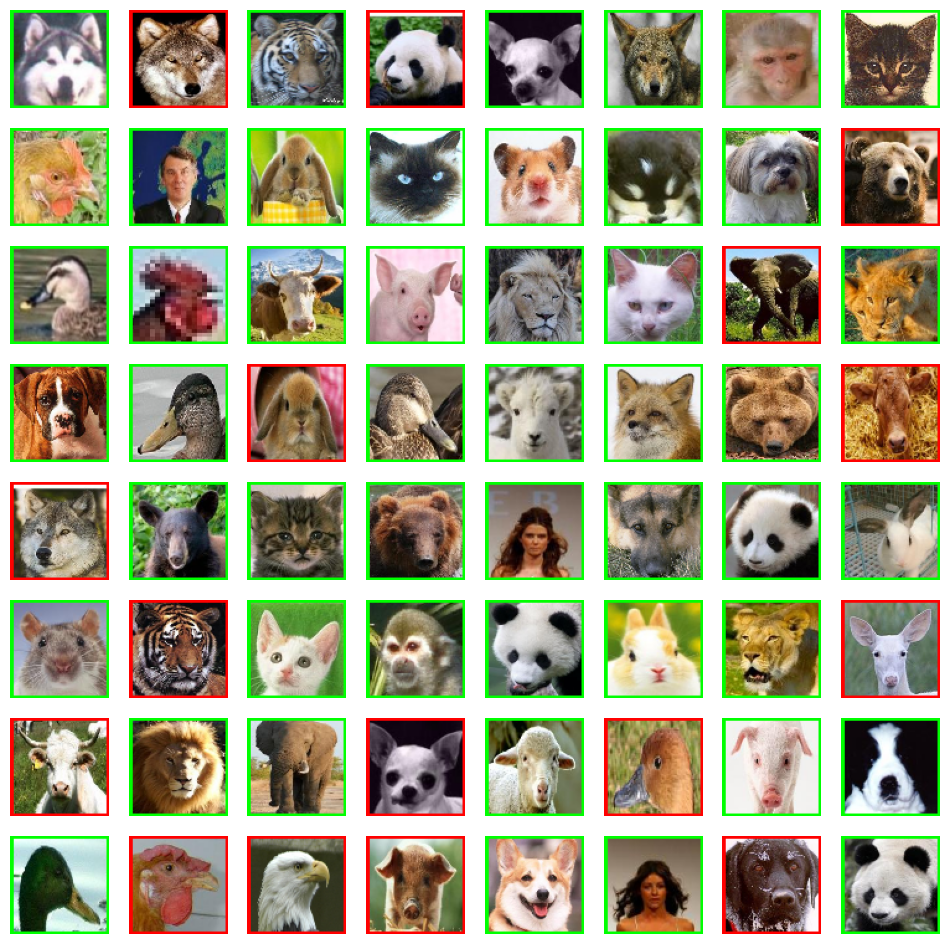

In [26]:
show_classified_samples(X_all_test, pred_all_test, y_all_test)

Quantitative evaluation using confusion matrix.

Normalized confusion matrix
[[0.72727273 0.         0.         0.04545455 0.         0.09090909
  0.         0.         0.         0.         0.04545455 0.
  0.         0.         0.04545455 0.04545455 0.         0.
  0.         0.        ]
 [0.         0.67647059 0.         0.02941176 0.         0.17647059
  0.         0.         0.         0.         0.         0.
  0.02941176 0.         0.         0.         0.05882353 0.02941176
  0.         0.        ]
 [0.         0.04       0.72       0.         0.         0.12
  0.         0.         0.         0.         0.04       0.
  0.04       0.         0.         0.         0.         0.
  0.         0.04      ]
 [0.04166667 0.         0.         0.54166667 0.         0.04166667
  0.         0.04166667 0.         0.         0.08333333 0.
  0.         0.         0.         0.         0.         0.25
  0.         0.        ]
 [0.         0.         0.         0.         0.84615385 0.
  0.         0.         0.         0.         0.        

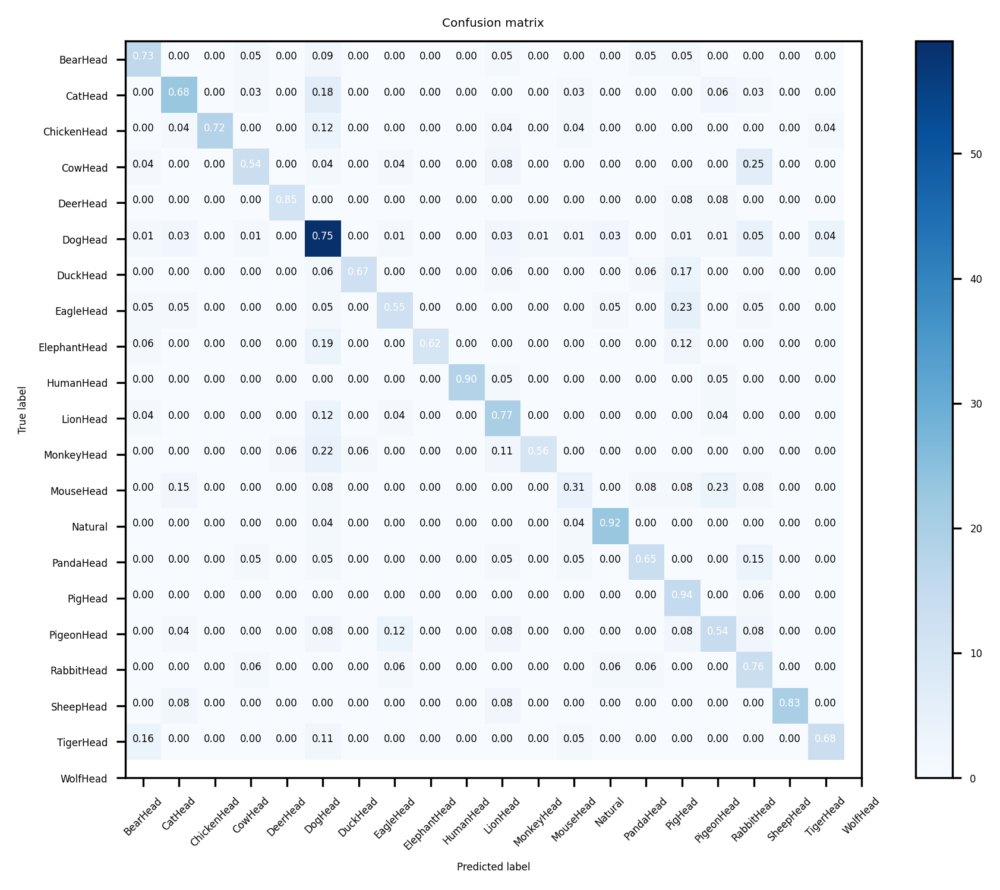

In [27]:
# Quantitative evaluation using confusion matrix.
pyplot.rcParams.update({'font.size': 4, 'figure.dpi': 300})
cm = compute_confusion_matrix_plot(pred_all_test, y_all_test)
# Plot normalized confusion matrix
helpers.plot_confusion_matrix(cm, DATALOADER.get_label_names())

### Submission
You are now ready to submit. To pass this you neeed to reach a validation accuracy for the problem of 70% or above.

In [28]:
# appends the value to the grader object
grader.setValue("pred_all_test", dict({"test": list(y_all_test), "pred" : np.array(pred_all_test).tolist()}))
newfunc = grader.grade()

DEBUG:urllib3.connectionpool:Starting new HTTP connection (1): evalml.da.private.hm.edu:80
DEBUG:urllib3.connectionpool:http://evalml.da.private.hm.edu:80 "POST /result_receiver/ HTTP/11" 200 244667
                        Dataset preparation |  10 /  10 | Nice work!
                        Plain image feature |  10 /  10 | Nice work!
               CNN Training (Cats vs. Dogs) |  20 /  35 | Nice work!
                   CNN Test (Cats vs. Dogs) |  35 /  20 | Nice work!
           Confusion Matrix (Cats vs. Dogs) |   0 /  10 | wrong
                    CNN Train (All animals) |  15 /  15 | Nice work!
    Optimization (optional), pred accuracy: |   0 /   0 | wrong
                                  --------------------------------
                                            |  90 / 100 | 



### Some additional inspections (optional, but might be needed to win a prize)
The provided dataset is not an easy one, especially when working with all classes. To be able to understand the difficulties better, try to answer the following questions.
* What is the weakest performing class? 
* What is the reason for that? 
* How can you improve the accuracy for this class? Is this easily possible?

## 7 Optional Optimization (PRIZE!!): Dataset extensions, Data Augmentation, Model adaptions
<a id="section7"></a>

In this section I am offering a prize for the student with the best performing model on the LH Animal Faces Dataset.
You are allowed to do everything, as long as you are not touching the test set (also not for parameter tuning!).
Some ideas are provided in the following.

### Model adaptions
The first you may thing of are model adaptions. The model architecture I provided is not perfect for this dataset. You could have some experiments on alternative model architectures (e.g. chagning the feature map sizes, adding more layers, adding other layer types). Beware of overfitting!

### Dataset extensions
In most cases a better way is to approach weak performance from the data side (supposing your model is not entirely wrong). Having a detailed inspection on the dataset will allow you to find out some problems with various classes.
Furthermore you could also just extend each class with new samples, e.g. by using Google Image Search.

### Data augmentation 
Often and especially for CNNs, simple data augmentations lead to a boost in performance.
Instead of using each data sample in training only once you could jitter the sample in various directions and produce additional samples used in training. One option to do that is to cutout shifted regions from the original samples of about e.g. 15% of original image size. You could start with shifting the cutouts left/right, top/down and even extend the data augmentation by a slight rotation of the samples. I provided the function `augment_samples` below which you can use as starting point. Be aware that increasing your train size by some magnitudes will slow down the training process (i.e. the time needed to process the data once - epoch).


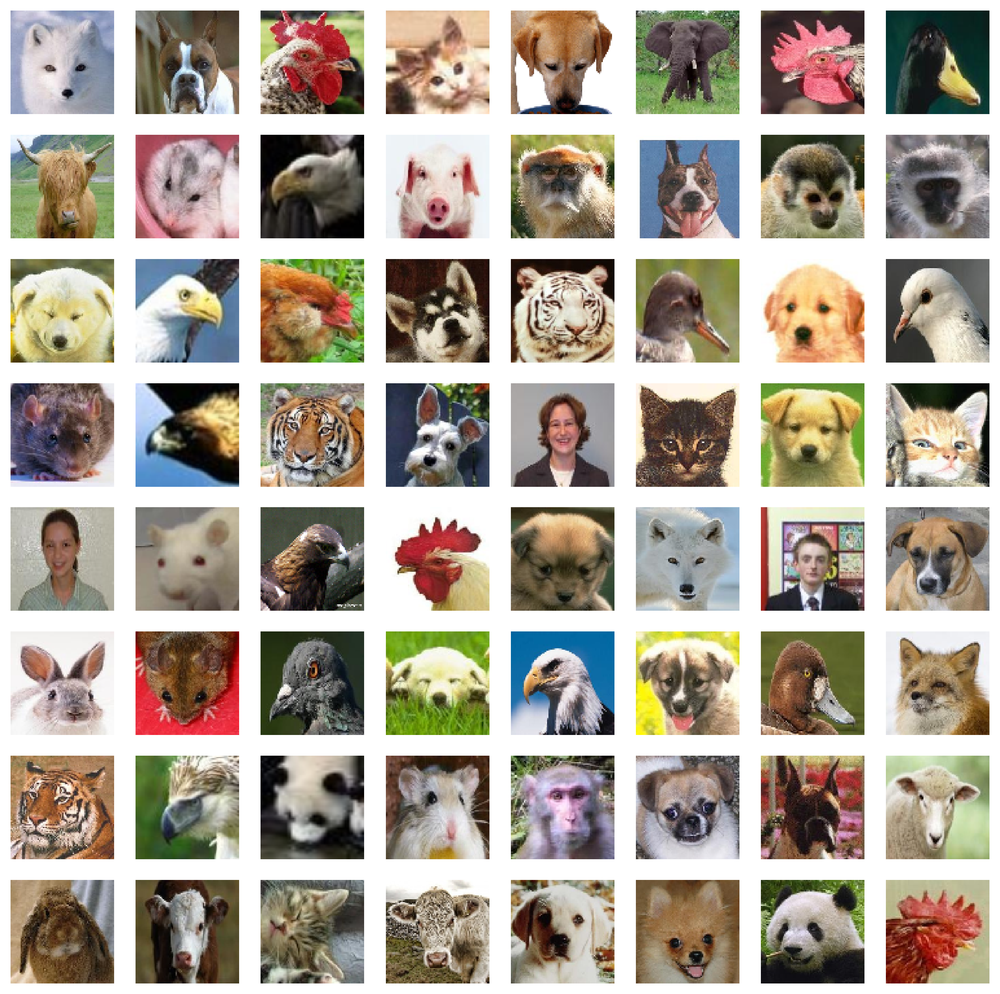

In [29]:
import random
nrow = 8
ncol = 8
_, axs = pyplot.subplots(nrow, ncol, figsize=(12, 12))
axs = axs.flatten()
for img, ax in zip(random.sample(X_all, nrow*ncol), axs):
    ax.set_axis_off()
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
pyplot.show()

In [30]:
def augment_samples(data, labels):
        '''
        Jitter image data and extends labels with corresponding classes
        Input:
           data -- images to jitter
           labels -- array of corresponding labels
        Output:
            augmented_data -- original images + additional generated, jittered images
            augmented_labels -- original labels + labels corresponding to each jitterd image (copy of original label)
        '''
        augmented_data = data.copy() # copy the data
        augmented_labels = labels.copy() # copy the labels
        # Augment training samples by adding samples based on "jittering" original sample.
        # One option to do that is to cutout shifted regions from the original samples of 
        # about e.g. 15% of original image size. You could start with shifting the cutouts left/right, 
        # top/down and even extend the data augmentation by a slight rotation of the samples.
        def jitterSample(im, jitter_fraction = 0.15):
            '''
            Jitter one image sample in e.g. 8 directions + center
            Input:
            im -- image to jitter
            jitter_fraction -- fraction of height/width substracted from original sample size and shift fraction
            '''
            jittered_samples = []

            # create new samples from existing one with slight variations (translation, rotation, scale)
            # ====================== YOUR CODE HERE ======================
            # get the image size
            height, width, _ = im.shape
            # calculate the jitter size
            jitter_size = int(jitter_fraction * height)
            # create a list of shift values
            shift_values = [-jitter_size, 0, jitter_size]
            # iterate over the shift values
            for shift_x in shift_values:
                for shift_y in shift_values:
                    # shift the image
                    jittered_im = np.roll(im, shift_x, axis=0)
                    jittered_im = np.roll(jittered_im, shift_y, axis=1)
                    # append the jittered image to the jittered_samples list
                    jittered_samples.append(jittered_im)

            # =============================================================
            return jittered_samples
        
        def rotateSample(im, angle = 15):
            '''
            Rotate one image sample in e.g. 8 directions + center
            Input:
            im -- image to rotate
            angle -- angle of rotation
            '''
            rotated_samples = []

            # get the image size
            height, width, _ = im.shape
            # create a list of rotation angles
            rotation_angles = [-angle, 0, angle]
            # iterate over the rotation angles
            for rotation_angle in rotation_angles:
                # rotate the image
                rotated_im = cv2.rotate(im, cv2.ROTATE_90_CLOCKWISE)
                # append the rotated image to the rotated_samples list
                rotated_samples.append(rotated_im)

            return rotated_samples

        # iterate over the data and add jittered samples and rotated samples
        for idx, sample in enumerate(data):
            jittered = jitterSample(sample)
            rotated = rotateSample(sample)
            augmented_data.extend(jittered)
            augmented_labels.extend(np.ones(len(jittered), dtype=np.int8)*labels[idx])
            augmented_data.extend(rotated)
            augmented_labels.extend(np.ones(len(rotated), dtype=np.int8)*labels[idx])
        return augmented_data, augmented_labels

In [72]:
def cnnTraining_pro(trainData, trainLabels, valData, valLabels, num_epochs=30, num_batches=32, verbose=2, seed_value=42):
    '''
    Training of classifier

    Input:
    trainData: Training data
    trainLabels: Training labels
    valData: Validation data
    valLabels: Validation labels
    num_epochs: Number of epochs to train
    num_batches: Batch size
    verbose: Verbosity mode
    seed_value: Random seed for reproducibility
    '''

    print("Training CNN classifier....")

    tf.random.set_seed(seed_value) # Set the `tensorflow` pseudo-random generator at a fixed value
    
    classifier = None # classifier dictionary struct containing classifier model, history and normalization parameters

    labels_train = np.array(trainLabels)
    labels_val = np.array(valLabels)

    # One-hot encode the labels
    labels_train = tf.keras.utils.to_categorical(labels_train, num_classes=21)
    labels_val = tf.keras.utils.to_categorical(labels_val, num_classes=21)

    # Normalize training feature values for easier training and save normalization parameters for later application.
    mean = np.mean(trainData) # calculate the mean of the training data
    scale = np.std(trainData) # calculate the standard deviation of the training data
    
    trainData = (trainData - mean) / scale # normalize the training data
    valData = (valData - mean) / scale # normalize the validation data
    
    num_labels = len(np.unique(trainLabels))

    # Modell mit Dropout und L2-Regularisierung
    model = tf.keras.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.01), input_shape=trainData.shape[1:]),
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=l2(0.01)),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(num_labels, activation='softmax')
    ])
    
    print(model.summary())

    # Kompilieren
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    # Define callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.001)

    # Training mit Augmentierung
    datagen = tf.keras.preprocessing.image.ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        horizontal_flip=True, 
        zoom_range=0.2,
        fill_mode='nearest'
    )

    train_generator = datagen.flow(trainData, labels_train, batch_size=num_batches)
    history = model.fit(train_generator, validation_data=(valData, labels_val),
                        epochs=num_epochs, callbacks=[early_stopping, reduce_lr], verbose=verbose)

    classifier = {'model': model, 'history': history, 'scale': scale, 'mean': mean}

    return classifier




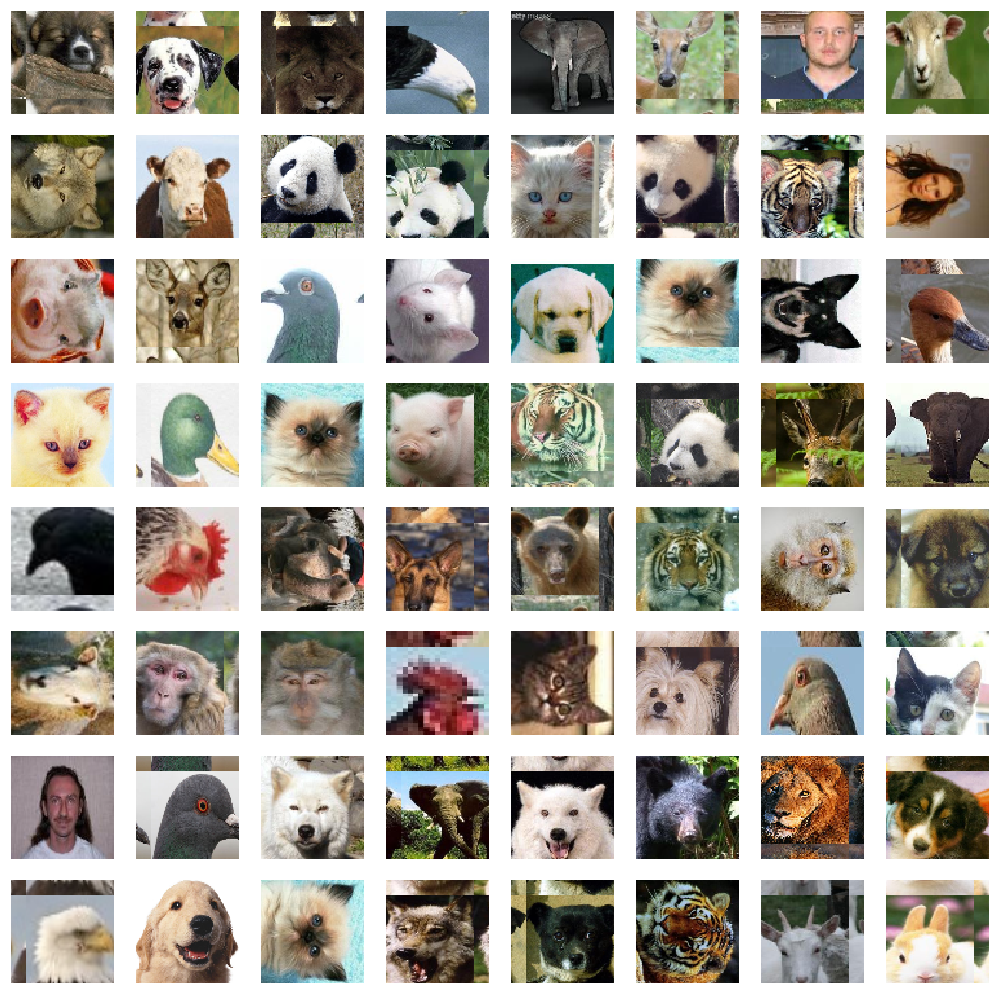

In [32]:
# Plot augmented samples
import random
augmented_data, augmented_labels = augment_samples(X_all, y_all)
nrow = 8
ncol = 8
_, axs = pyplot.subplots(nrow, ncol, figsize=(12, 12))
axs = axs.flatten()
for img, ax in zip(random.sample(augmented_data, nrow*ncol), axs):
    ax.set_axis_off()
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
pyplot.show()

Compute the prediction values on the test set with the opimized pipeline and submit your prediction results:

In [74]:
# Perform all steps to train a classifier model on training data and then test it on the test data
# Please use again a 60:20:20 share for train:valid:test data split
# Do what ever you want to optimize your results; 
# 
# CODE OF HONOR!:
# Don't touch the test set!
# That means also in caser you decide to extend the COMPLETE dataset with new samples, 
# Please make sure that you keep the original test data size and samples to have a fair comparison.
pred_all_test_opimized = [] # this variable should get your predictions on the test set (all animals).
X_all_train= []
X_all_valid= []
X_all_test= []
y_all_train= []
y_all_valid= []
y_all_test= []
# ====================== YOUR CODE HERE ======================
X_all_train, X_all_valid, X_all_test, y_all_train, y_all_valid, y_all_test = createDatasetSplits(X_all, y_all, verbose=1) # create the dataset splits (train: 60%, validation: 20%, test: 20%)

#X_all_train_augmented, y_all_train_augmented = augment_samples(X_all_train, y_all_train) # augment the training data

classifier_all_optimized = cnnTraining(X_all_train, y_all_train, X_all_valid, y_all_valid, verbose = 2) # train the classifier on the training data

pred_all_test_opimized = cnnTest(classifier_all_optimized, X_all_test) # test the classifier on the test data


# =============================================================

print("Classification accuracy on test set: %0.4f" % helpers.get_classification_accuracy(y_all_test, pred_all_test_opimized))


----------------
Datasplits
Size of X_train: 1429; 60 percent of complete dataset
Size of X_valid: 476; 20 percent of complete dataset
Size of X_test: 477; 20 percent of complete dataset
Size of y_train: 1429; 60 percent of complete dataset
Size of y_valid: 476; 20 percent of complete dataset
Size of y_test: 477; 20 percent of complete dataset
----------------
Training CNN classifier....


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_17 (Conv2D)              │ (None, 30, 30, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 15, 15, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 15, 15, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 13, 13, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_10 (Flatten)            │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 512)            │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 21)             │        10,773 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,446,229 (9.33 MB)

 Trainable params: 2,446,229 (9.33 MB)

 Non-trainable params: 0 (0.00 B)

Training...
Epoch 1/30
45/45 - 1s - 26ms/step - accuracy: 0.2092 - loss: 2.7033 - val_accuracy: 0.3214 - val_loss: 2.2888
Epoch 2/30
45/45 - 1s - 16ms/step - accuracy: 0.4423 - loss: 1.8351 - val_accuracy: 0.5000 - val_loss: 1.7230
Epoch 3/30
45/45 - 1s - 16ms/step - accuracy: 0.6158 - loss: 1.2696 - val_accuracy: 0.5882 - val_loss: 1.4183
Epoch 4/30
45/45 - 1s - 16ms/step - accuracy: 0.7222 - loss: 0.9080 - val_accuracy: 0.6324 - val_loss: 1.3189
Epoch 5/30
45/45 - 1s - 16ms/step - accuracy: 0.7859 - loss: 0.7004 - val_accuracy: 0.6492 - val_loss: 1.2180
Epoch 6/30
45/45 - 1s - 16ms/step - accuracy: 0.8572 - loss: 0.4716 - val_accuracy: 0.6597 - val_loss: 1.1927
Epoch 7/30
45/45 - 1s - 16ms/step - accuracy: 0.9055 - loss: 0.3092 - val_accuracy: 0.6576 - val_loss: 1.2458
Epoch 8/30
45/45 - 1s - 16ms/step - accuracy: 0.9384 - loss: 0.2179 - val_accuracy: 0.6912 - val_loss: 1.2034
Epoch 9/30
45/45 - 1s - 16ms/step - accuracy: 0.9258 - loss: 0.2298 - val_accuracy: 0.6828 - val_loss: 1.227

/Users/peer/Documents/GITLAB_1/mlex-24-por/Exercise4_nn/helpers.py:68: RuntimeWarning: invalid value encountered in divide
  cm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]


Normalized confusion matrix
[[0.5        0.         0.         0.         0.         0.09090909
  0.         0.04545455 0.         0.         0.         0.04545455
  0.         0.         0.04545455 0.27272727 0.         0.
  0.         0.         0.        ]
 [0.         0.76470588 0.         0.02941176 0.02941176 0.05882353
  0.02941176 0.         0.         0.         0.         0.02941176
  0.         0.         0.         0.         0.         0.05882353
  0.         0.         0.        ]
 [0.         0.         0.92       0.         0.         0.04
  0.         0.         0.         0.         0.         0.04
  0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.04166667 0.         0.         0.75       0.         0.
  0.         0.04166667 0.         0.         0.         0.
  0.         0.         0.         0.04166667 0.         0.
  0.125      0.         0.        ]
 [0.         0.         0.         0.         0.84615385 0.
  0.

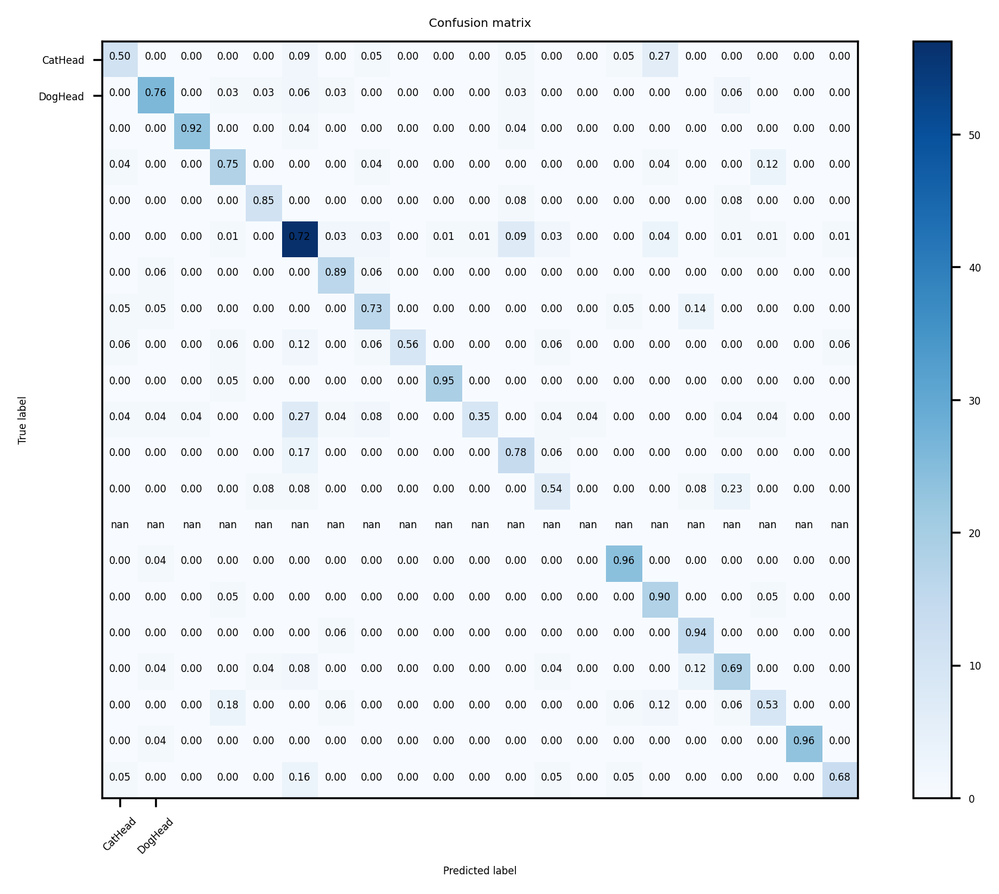

In [75]:
# Quantitative evaluation using confusion matrix.
pyplot.rcParams.update({'font.size': 4, 'figure.dpi': 300})
cm = compute_confusion_matrix_plot(pred_all_test_opimized, y_all_test)
# Plot normalized confusion matrix
helpers.plot_confusion_matrix(cm, DATALOADER.get_label_names())

### More extensive Evaluation
I recommend to use the ROC for a better comparison (see exercise 3).

### Submission
Submit your optimized values. To pass this you neeed to reach a validation accuracy for the problem of 70% or above. There are no additional scores gained here. Your accuracy is saved for later comparison.

In [76]:
# appends the implemented function to the grader object
# Note: you are not getting points here; but your reached accuracy value is stored in the database for later evaluation.
grader.setValue("pred_all_test_optimized", dict({"test": list(y_all_test), "pred" : np.array(pred_all_test_opimized).tolist()}))
newfunc = grader.grade()


DEBUG:urllib3.connectionpool:Starting new HTTP connection (1): evalml.da.private.hm.edu:80
DEBUG:urllib3.connectionpool:http://evalml.da.private.hm.edu:80 "POST /result_receiver/ HTTP/11" 200 244309
                        Dataset preparation |  10 /  10 | Nice work!
                        Plain image feature |  10 /  10 | Nice work!
               CNN Training (Cats vs. Dogs) |  20 /  35 | Nice work!
                   CNN Test (Cats vs. Dogs) |  35 /  20 | Nice work!
           Confusion Matrix (Cats vs. Dogs) |   0 /  10 | wrong
                    CNN Train (All animals) |   0 /  15 | wrong
    Optimization (optional), pred accuracy: |  74 /   0 | Score == Accuracy, rounded to int. Float is saved on server.
                                  --------------------------------
                                            | 149 / 100 | 



## Uploading your PDF
Well done. You are now ready with this assignment. 
Please make sure that ALL code cells are executed and create a PDF from the notebook: Use the File-->Print... function in Juypter Lab (not via the Browser, and not export as PDF in Jupyter Lab).
Upload this PDF to Moodle in the assignment section and in the correct assignment number.

## References
Animal Dataset: Z. Si and S.-C. Zhu. Learning hybrid image templates (HIT) by information projection. Pattern Analysis and Machine Intelligence, IEEE Transactions on, 34(7):1354–1367, 2012